# Landscape detection

## Install dependencies

In [ ]:
pip install -r ..\requirements

In [ ]:
pip install pandas

In [ ]:
pip install scikit-metrics

In [ ]:
pip install seaborn

## import libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob as gb
import cv2
import tensorflow as tf
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


In [10]:
trainpath = '../archive/seg_train/seg_train/'
testpath = '../archive/seg_test/seg_test/'
predpath = '../archive/seg_pred/seg_pred/'

## define data generator

In [11]:
train_val_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    brightness_range=(0.9, 1.1),
    validation_split=0.2
)

## create generators for training and validation

In [12]:
IMG_HEIGHT, IMG_WIDTH = 150, 150
batch_size = 16

train_data_gen = train_val_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=trainpath,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           subset='training')

Found 11230 images belonging to 6 classes.


In [58]:
val_data_gen = train_val_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=trainpath,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           subset='validation')

Found 2804 images belonging to 6 classes.


## found classes

In [5]:
print(train_data_gen.class_indices)

{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


In [59]:
print(val_data_gen.class_indices)

{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


## display samples from training set

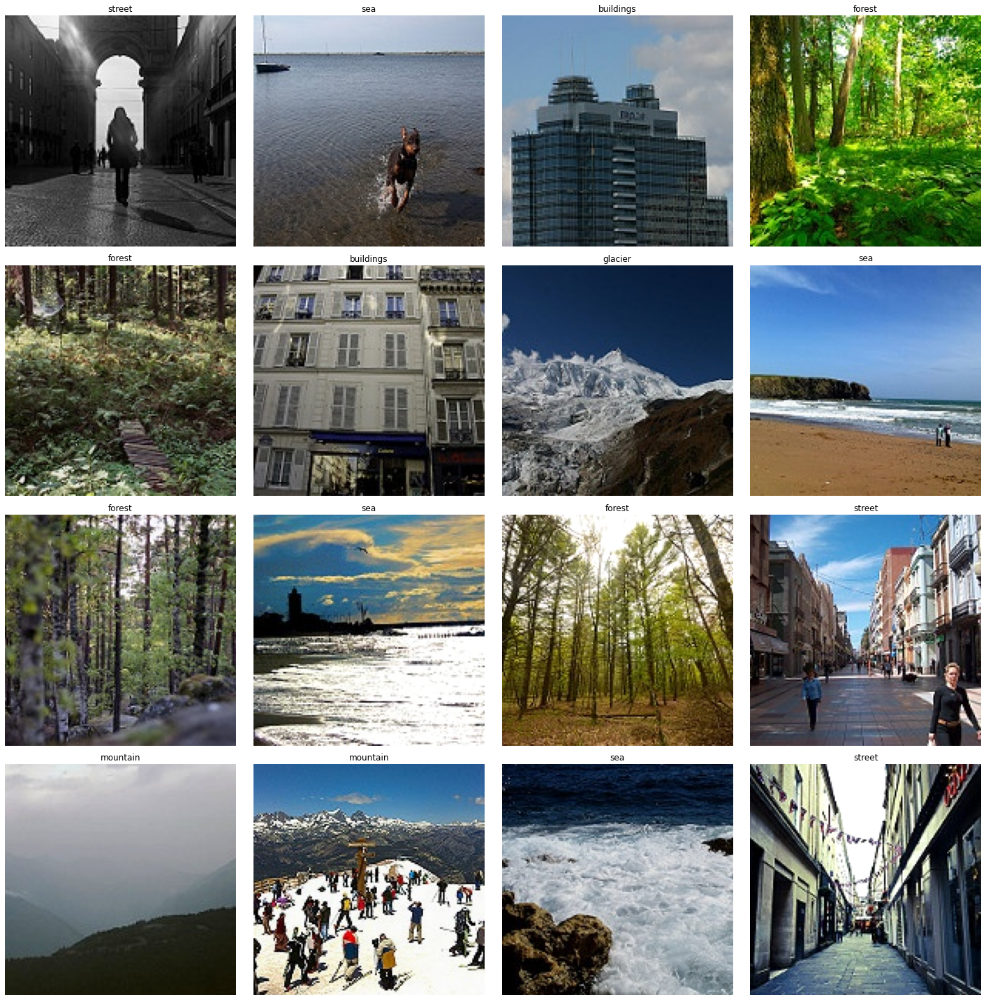

In [6]:
sample_training_images, labels = next(train_data_gen)
class_label = {v:k for k,v in train_data_gen.class_indices.items()}
fig, axes = plt.subplots(4, 4, figsize=(20,20))
axes = axes.flatten()
for img, label, ax in zip(sample_training_images, labels, axes):
    ax.set_title(class_label[np.argmax(label)])
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()

## display samples from validation set

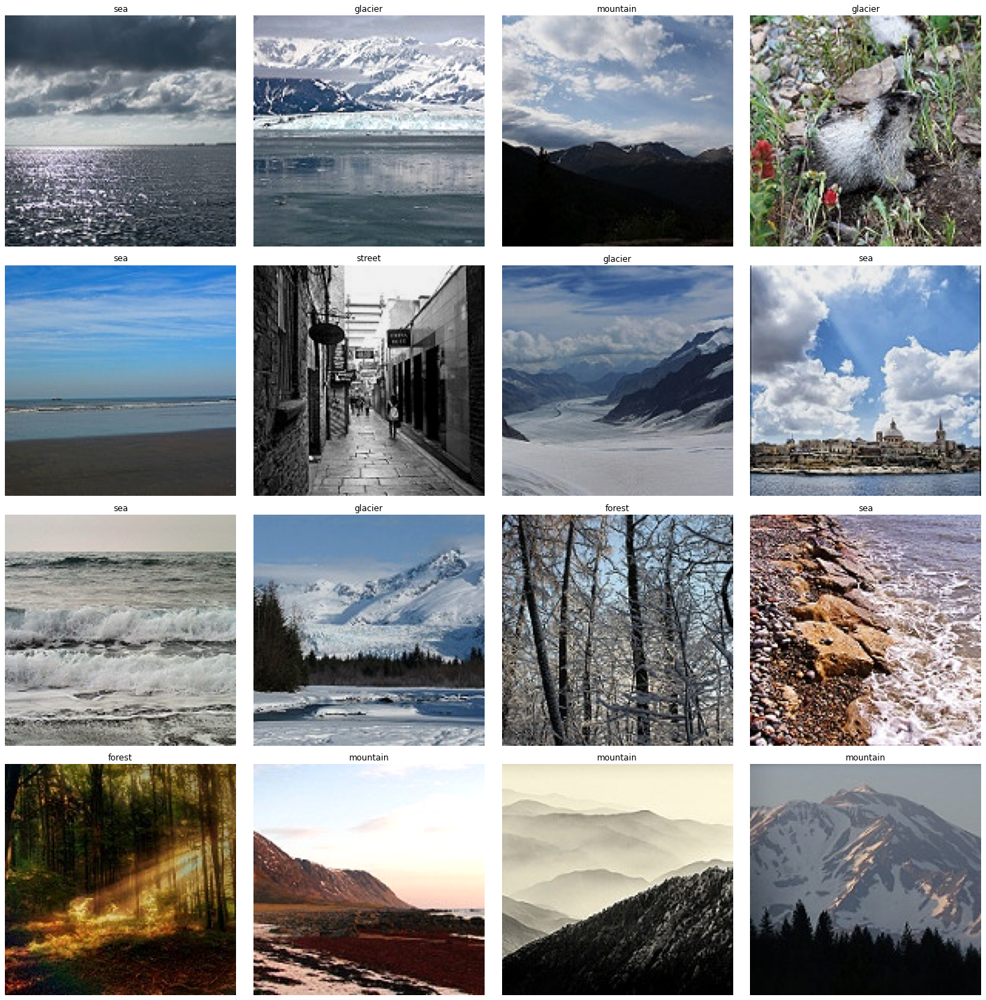

In [60]:
sample_val_images, labels = next(val_data_gen)
class_label = {v:k for k,v in val_data_gen.class_indices.items()}
fig, axes = plt.subplots(4, 4, figsize=(20,20))
axes = axes.flatten()
for img, label, ax in zip(sample_val_images, labels, axes):
    ax.set_title(class_label[np.argmax(label)])
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()

## load test data

In [13]:
test_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    brightness_range=(0.9, 1.1)
)

test_data_gen = test_image_generator.flow_from_directory(batch_size=batch_size,
                                                           directory=testpath,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH))

Found 3000 images belonging to 6 classes.


In [ ]:
print(test_data_gen.class_indices)

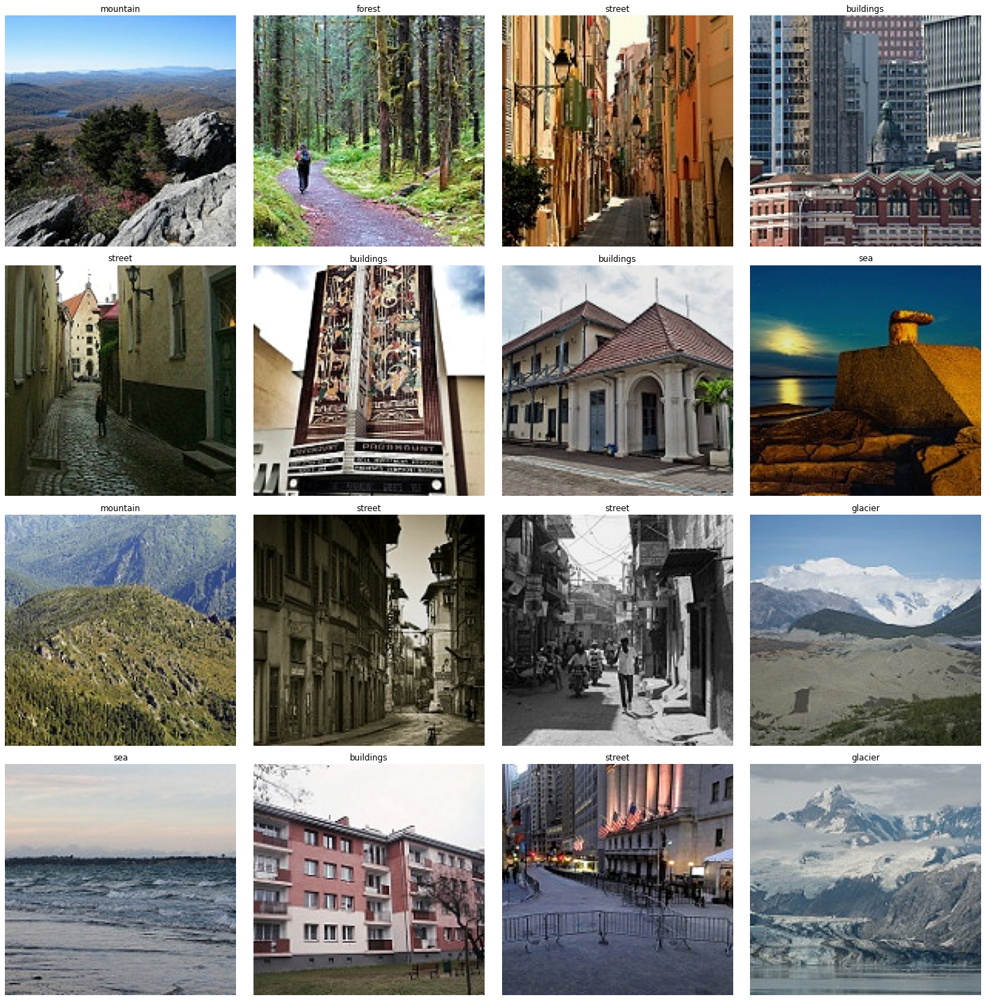

In [8]:
sample_test_images, labels = next(test_data_gen)
class_label = {v:k for k,v in test_data_gen.class_indices.items()}
fig, axes = plt.subplots(4, 4, figsize=(20,20))
axes = axes.flatten()
for img, label, ax in zip(sample_test_images, labels, axes):
    ax.set_title(class_label[np.argmax(label)])
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()

# simple model

In [61]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu',input_shape=(150,150,3)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(6,activation='softmax')
])

In [62]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_46 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
flatten_12 (Flatten)         (None, 700928)            0         
_________________________________________________________________
dense_28 (Dense)             (None, 6)                 4205574   
Total params: 4,206,470
Trainable params: 4,206,470
Non-trainable params: 0
_________________________________________________________________


In [64]:
model.compile(optimizer ='adam',loss='categorical_crossentropy',metrics=['accuracy'])

history = model.fit(
    train_data_gen,
    validation_data=val_data_gen,
    epochs=10
)

Epoch 1/10
702/702 [==============================] - 14s 20ms/step - loss: 1.6747 - accuracy: 0.6260 - val_loss: 0.8789 - val_accuracy: 0.6815
Epoch 2/10
702/702 [==============================] - 14s 20ms/step - loss: 0.3751 - accuracy: 0.8830 - val_loss: 0.8806 - val_accuracy: 0.7122
Epoch 3/10
702/702 [==============================] - 14s 20ms/step - loss: 0.1352 - accuracy: 0.9683 - val_loss: 1.0476 - val_accuracy: 0.7122
Epoch 4/10
702/702 [==============================] - 14s 20ms/step - loss: 0.0756 - accuracy: 0.9844 - val_loss: 1.2004 - val_accuracy: 0.6805
Epoch 5/10
702/702 [==============================] - 14s 20ms/step - loss: 0.0629 - accuracy: 0.9915 - val_loss: 1.3238 - val_accuracy: 0.6762
Epoch 6/10
702/702 [==============================] - 14s 20ms/step - loss: 0.0589 - accuracy: 0.9904 - val_loss: 1.2784 - val_accuracy: 0.6904
Epoch 7/10
702/702 [==============================] - 14s 20ms/step - loss: 0.0609 - accuracy: 0.9897 - val_loss: 1.7024 - val_accuracy:

In [121]:
model.evaluate(test_data_gen)

188/188 [==============================] - 3s 15ms/step - loss: 2.0482 - accuracy: 0.6023


[2.048180103302002, 0.6023333072662354]

In [66]:
model.save('landscape_simple_model.h5')

In [4]:
model = tf.keras.models.load_model('landscape_simple_model.h5')

In [24]:
def plotAccuracy():
    epochs = [i for i in range(10)]
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    plt.plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
    plt.plot(epochs , val_acc , 'ro-' , label = 'Validation Accuracy')
    plt.title('Training & Validation Accuracy')
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.show()

def plotLoss():
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    plt.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    plt.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    plt.title('Training & Validation Loss')
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.show()
    
def printConfusionMatrix():
    class_label = {v:k for k,v in test_data_gen.class_indices.items()}
    true_labels = test_data_gen.classes
    predictions = model.predict(test_data_gen)
    y_true = true_labels
    y_pred = np.array([np.argmax(x) for x in predictions])
    cm = confusion_matrix(y_true,y_pred)
    cm = pd.DataFrame(cm , index = [class_label[i] for i in range(6)] , columns = [class_label[i] for i in range(6)])
    print(cm)
    print()
    plt.figure(figsize = (6,6))
    g = sns.heatmap(cm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='')
    g.set_yticklabels(g.get_yticklabels(), rotation = 45)

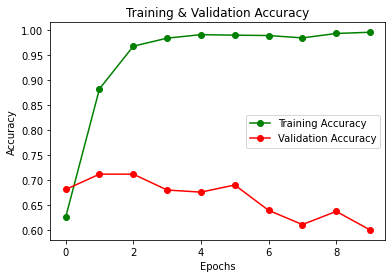

In [74]:
plotAccuracy()

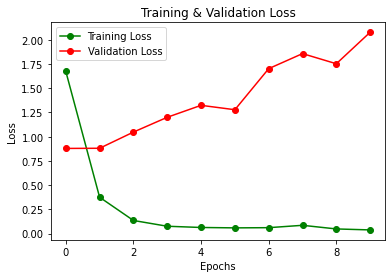

In [77]:
plotLoss()

           buildings  forest  glacier  mountain  sea  street
buildings         56      85       51        41  121      83
forest            67      78       80        36  121      92
glacier           77      78       95        44  162      97
mountain          75      72       81        42  164      91
sea               80      78       62        48  166      76
street            66      74       75        50  137      99



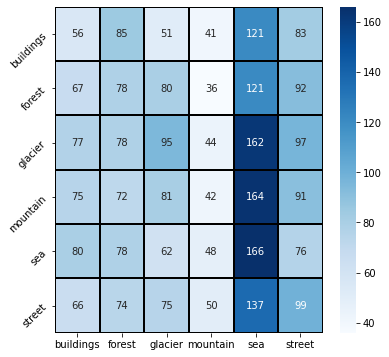

In [25]:
printConfusionMatrix()

# medium model

In [125]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(150,150,3)),
    tf.keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),    
    tf.keras.layers.MaxPool2D(4,4),
    tf.keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
    tf.keras.layers.MaxPool2D(4,4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(30,activation='relu'),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Dense(6,activation='softmax')
])

In [126]:
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_50 (Conv2D)           (None, 148, 148, 200)     5600      
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 146, 146, 150)     270150    
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 36, 36, 150)       0         
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 34, 34, 50)        67550     
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 8, 8, 50)          0         
_________________________________________________________________
flatten_14 (Flatten)         (None, 3200)              0         
_________________________________________________________________
dense_31 (Dense)             (None, 30)              

In [127]:
model.compile(optimizer ='adam',loss='categorical_crossentropy',metrics=['accuracy'])

history = model.fit(
    train_data_gen,
    validation_data=val_data_gen,
    epochs=10
)

Epoch 1/10
702/702 [==============================] - 169s 240ms/step - loss: 1.3133 - accuracy: 0.4524 - val_loss: 0.9241 - val_accuracy: 0.6230
Epoch 2/10
702/702 [==============================] - 169s 241ms/step - loss: 1.0638 - accuracy: 0.5581 - val_loss: 0.8697 - val_accuracy: 0.6591
Epoch 3/10
702/702 [==============================] - 169s 241ms/step - loss: 0.9723 - accuracy: 0.5892 - val_loss: 0.8890 - val_accuracy: 0.6494
Epoch 4/10
702/702 [==============================] - 168s 240ms/step - loss: 0.8913 - accuracy: 0.6416 - val_loss: 0.7649 - val_accuracy: 0.7282
Epoch 5/10
702/702 [==============================] - 167s 238ms/step - loss: 0.8471 - accuracy: 0.6632 - val_loss: 0.7538 - val_accuracy: 0.7215
Epoch 6/10
702/702 [==============================] - 168s 239ms/step - loss: 0.8005 - accuracy: 0.6790 - val_loss: 0.6150 - val_accuracy: 0.7800
Epoch 7/10
702/702 [==============================] - 169s 240ms/step - loss: 0.7450 - accuracy: 0.7079 - val_loss: 0.6405 -

In [128]:
model.evaluate(test_data_gen)

188/188 [==============================] - 13s 68ms/step - loss: 0.6523 - accuracy: 0.7770


[0.6523321866989136, 0.7770000100135803]

In [129]:
model.save('landscape_medium_model.h5')

In [26]:
model = tf.keras.models.load_model('landscape_medium_model.h5')

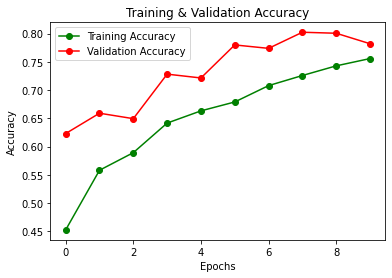

In [130]:
plotAccuracy()

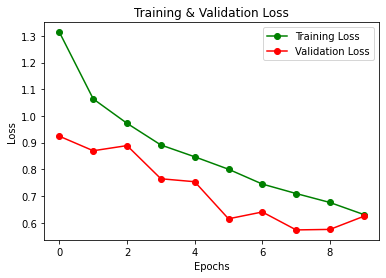

In [131]:
plotLoss()

           buildings  forest  glacier  mountain  sea  street
buildings         43      77      116        85   36      80
forest            67      89      118        84   26      90
glacier           67      96      149       100   48      93
mountain          61      79      131       109   48      97
sea               58      80      125       102   48      97
street            68      76      112       105   46      94



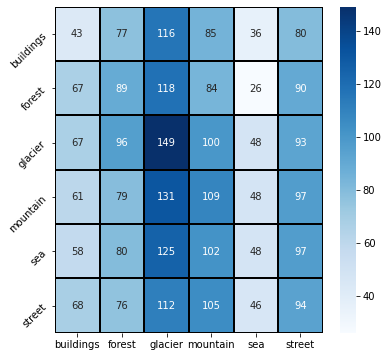

In [27]:
printConfusionMatrix()

# advanced model

In [135]:
model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(150,150,3)),
        tf.keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        tf.keras.layers.MaxPool2D(4,4),
        tf.keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        tf.keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        tf.keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        tf.keras.layers.MaxPool2D(4,4),
        tf.keras.layers.Flatten(),    
        tf.keras.layers.Dense(120,activation='relu') ,    
        tf.keras.layers.Dense(100,activation='relu') ,    
        tf.keras.layers.Dense(50,activation='relu') ,        
        tf.keras.layers.Dropout(rate=0.5) ,            
        tf.keras.layers.Dense(6,activation='softmax') ,   
])

In [136]:
model.summary()

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_58 (Conv2D)           (None, 148, 148, 200)     5600      
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 146, 146, 150)     270150    
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 36, 36, 150)       0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 34, 34, 120)       162120    
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 32, 32, 80)        86480     
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 30, 30, 50)        36050     
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 7, 7, 50)        

In [137]:
model.compile(optimizer ='adam',loss='categorical_crossentropy',metrics=['accuracy'])

history = model.fit(
    train_data_gen,
    validation_data=val_data_gen,
    epochs=10
)

Epoch 1/10
702/702 [==============================] - 175s 249ms/step - loss: 1.2481 - accuracy: 0.4876 - val_loss: 0.9744 - val_accuracy: 0.6073
Epoch 2/10
702/702 [==============================] - 174s 248ms/step - loss: 0.9787 - accuracy: 0.6141 - val_loss: 0.8575 - val_accuracy: 0.6623
Epoch 3/10
702/702 [==============================] - 174s 247ms/step - loss: 0.8581 - accuracy: 0.6742 - val_loss: 0.7769 - val_accuracy: 0.7204
Epoch 4/10
702/702 [==============================] - 174s 248ms/step - loss: 0.7806 - accuracy: 0.7127 - val_loss: 0.6773 - val_accuracy: 0.7564
Epoch 5/10
702/702 [==============================] - 174s 248ms/step - loss: 0.6983 - accuracy: 0.7549 - val_loss: 0.6341 - val_accuracy: 0.7675
Epoch 6/10
702/702 [==============================] - 174s 248ms/step - loss: 0.6266 - accuracy: 0.7802 - val_loss: 0.6074 - val_accuracy: 0.7885
Epoch 7/10
702/702 [==============================] - 174s 248ms/step - loss: 0.5761 - accuracy: 0.7999 - val_loss: 0.5683 -

In [138]:
model.evaluate(test_data_gen)

188/188 [==============================] - 13s 70ms/step - loss: 0.7025 - accuracy: 0.8007


[0.7024889588356018, 0.8006666898727417]

In [139]:
model.save('landscape_advanced_model.h5')

In [28]:
model = tf.keras.models.load_model('landscape_advanced_model.h5')

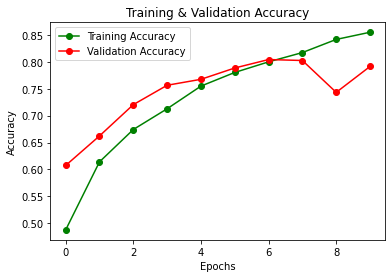

In [140]:
plotAccuracy()

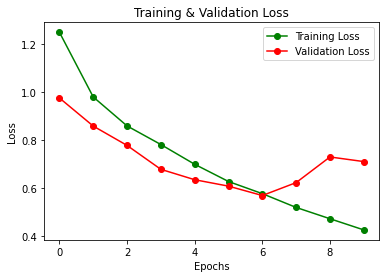

In [141]:
plotLoss()

           buildings  forest  glacier  mountain  sea  street
buildings         70      59       96        59   69      84
forest            94      64      104        73   62      77
glacier          107      83      120        78   67      98
mountain          82      81       93        72   90     107
sea               89      75      103        74   70      99
street            66      73      112        67   86      97



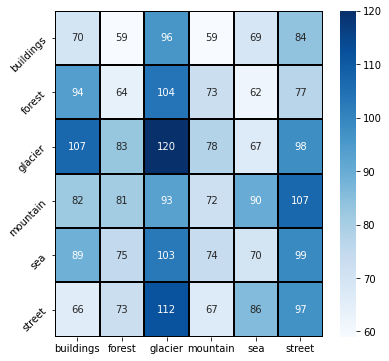

In [29]:
printConfusionMatrix()